In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
header=4096

In [5]:
f = open('2022.EI1', "r")
a = np.fromfile(f, dtype=np.int16 , count=header )
b = np.fromfile(f, dtype=np.int16)
f.close()

In [6]:
data48=np.reshape(b,(int(len(b)/16),16)) #signo ordea las cosas columnas primero
cols=[]
df48=pd.DataFrame(data48)
for i,x in enumerate(['xy']*8):
    cols.append(x[0]+str(i+1))
    cols.append(x[1]+str(i+1))
df48.columns=cols    
canales=['canal_'+str(i+1) for i in range(8)]

In [7]:
df48

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8
0,-1179,644,-1172,3754,1001,1782,2080,540,32767,32767,32767,30118,28084,28000,-13715,-7698
1,-1180,642,-1172,3755,1002,1783,2081,540,32767,32767,32767,30114,28079,28001,-13713,-7703
2,-1181,641,-1171,3756,1002,1782,2081,542,32767,32767,32767,30117,28081,28002,-13712,-7699
3,-1181,640,-1169,3756,1002,1782,2081,543,32767,32767,32767,30124,28088,28006,-13712,-7693
4,-1182,639,-1167,3756,1002,1783,2081,543,32767,32767,32767,30132,28096,28009,-13713,-7688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19897,-890,567,-921,3386,892,1320,1797,345,32767,32767,32767,30164,28232,27977,-13760,-7651
19898,-890,569,-923,3386,891,1319,1800,347,32767,32767,32767,30162,28226,27975,-13760,-7654
19899,-891,570,-924,3386,890,1321,1802,348,32767,32767,32767,30158,28215,27973,-13760,-7660
19900,-876,571,-925,3388,891,1323,1802,349,32767,32767,32767,30153,28208,27972,-13759,-7664


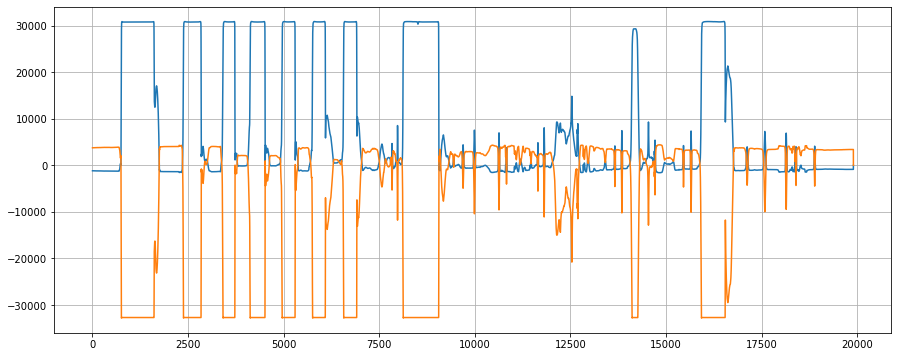

In [9]:
plt.figure(figsize=[15,6])
plt.plot(df48.x1)
plt.plot(df48.y2)
plt.grid(True)

In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing  import MinMaxScaler
scaler = StandardScaler()
scaler = MinMaxScaler()

In [12]:
df_sd=pd.DataFrame(scaler.fit_transform(df48.values))
df_sd.columns=cols    


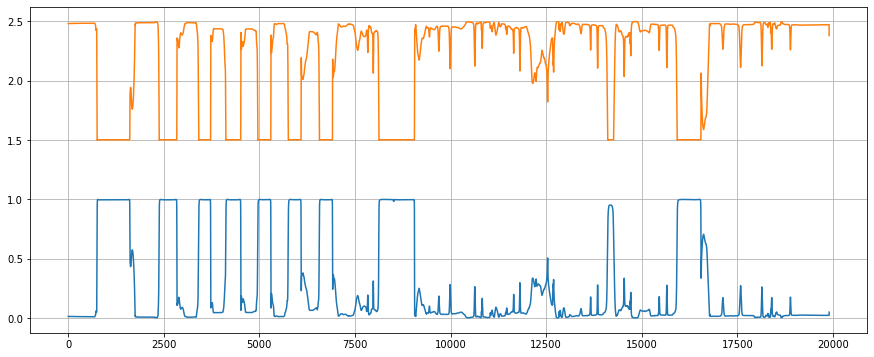

In [13]:
plt.figure(figsize=[15,6])
plt.plot(df_sd.x1)
plt.plot(df_sd.y2 + 1.5)
plt.grid(True)

In [14]:
import plotly.express as px


In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


fig = make_subplots(rows=1, cols=1)
fig.add_trace(  go.Scatter(y=df_sd.x1))
fig.add_trace(  go.Scatter(y=df_sd.y1 + 1.5))
fig.update_layout(height=400, width=1000 ,  xaxis=dict(
         rangeslider=dict(visible=True )) )
fig.show()

In [16]:
def plot(ch):
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(  go.Scatter(y=df_sd.iloc[:,2*(ch)-2]))
    fig.add_trace(  go.Scatter(y=df_sd.iloc[:,2*(ch)-1] + 1.5))
    fig.update_layout(height=400, width=1000 ,  xaxis=dict(
             rangeslider=dict(visible=True )) )
    fig.show()

In [17]:
plot(1)

In [90]:
frecs=[ '60k' , '120k', '240k' , '480k']*2

In [107]:
class Exp():
    def __init__(self,path):
        self.path=path
        self.load()
        
    def load(self):
        header=4096        
        f = open(self.path, "r")
        a = np.fromfile(f, dtype=np.int16 , count=header )
        b = np.fromfile(f, dtype=np.int16)
        f.close()
        data48=np.reshape(b,(int(len(b)/16),16)) #signo ordea las cosas columnas primero
        cols=['x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4', 'x5', 'y5', 'x6', 'y6', 'x7', 'y7', 'x8', 'y8']
        #scaler = MinMaxScaler()
        #df48=pd.DataFrame(scaler.fit_transform(data48))
        df48=pd.DataFrame(data48)
        df48.columns=cols
        self.df=df48
        self.canales=['canal_1', 'canal_2', 'canal_3', 'canal_4', 'canal_5', 'canal_6', 'canal_7', 'canal_8']
        self.frecs=['60k', '120k', '240k', '480k', '60k', '120k', '240k', '480k']
        
    def plot(self,ch):
        fig = make_subplots(rows=1, cols=1)
        fig.add_trace(  go.Scatter(y=self.df.iloc[:,2*(ch)-2]))
        fig.add_trace(  go.Scatter(y=self.df.iloc[:,2*(ch)-1] + 1.5))
        fig.update_layout(height=400, width=1000 ,  xaxis=dict(
         rangeslider=dict(visible=True )) )
        fig.show()

In [108]:
f2=Exp('.//2022//2022.EI2')

In [109]:
f2.plot(1)

In [22]:
f2.df.x1

0        0.003823
1        0.003823
2        0.003823
3        0.003704
4        0.003704
           ...   
11737    0.021983
11738    0.021864
11739    0.021744
11740    0.023536
11741    0.093668
Name: x1, Length: 11742, dtype: float64

In [23]:
from scipy.signal import find_peaks

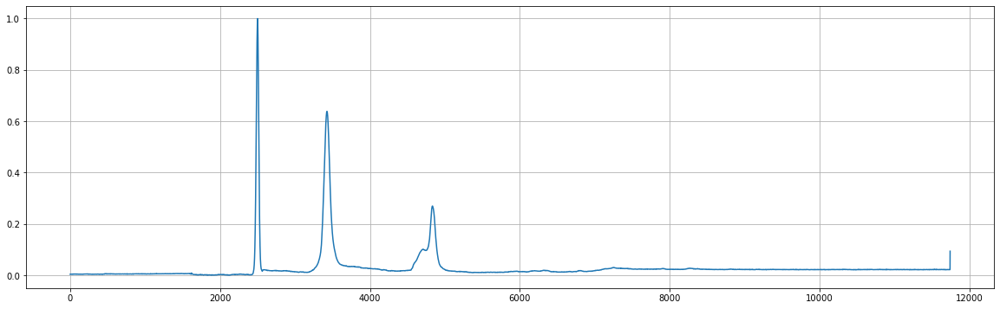

In [24]:
plt.figure(figsize=(20,6))
plt.plot(f2.df.x1)
plt.grid(True)

https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html

In [25]:
thr=0.2
peaks, _ = find_peaks(f2.df.x1,height=thr)

In [73]:
peaks

array([2500, 3426, 4834], dtype=int64)

In [74]:
len(peaks)

3

In [27]:
sr=1024

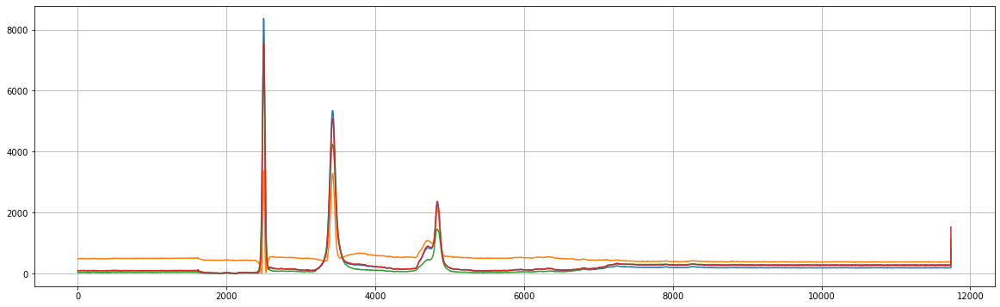

In [199]:
plt.figure(figsize=(20,6))
plt.plot(f2.df.x1 - f2.df.x1.min())
plt.plot(f2.df.x2 - f2.df.x2.min())
plt.plot(-f2.df.x3 + f2.df.x3.max())
plt.plot(-f2.df.x4 + f2.df.x4.max())
plt.grid(True)
plt.show()

In [47]:
len(f2.df.x1)

11742

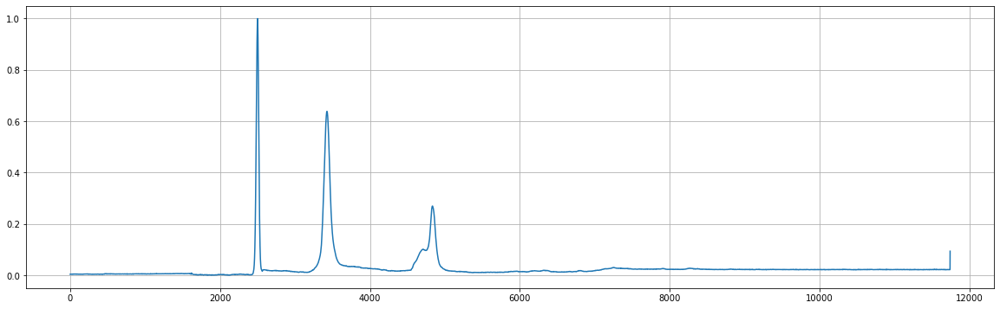

In [50]:
plt.figure(figsize=(20,6))
plt.plot(f2.df.x1)
plt.grid(True)

In [51]:
peaks

array([2500, 3426, 4834], dtype=int64)

In [53]:
x=f2.df.x1

In [57]:
int((peaks[1]-peaks[0])/2)

463

In [72]:
nsig

3

In [88]:
for x in range(0,3): print(x)

0
1
2


In [185]:
def get_peaks(x,thr=0.2): 
    x=x-x.mean()
    peaks, _ = find_peaks(x,height=thr)
    nsig=len(peaks)
    signals=[]
    indexs=[]
    print('picos: ',nsig)
    for i in range(0,nsig):
        if i == nsig-1:
            dx=int((peaks[i]-peaks[i-1])/2)
            start=peaks[i]-dx
            end=peaks[i]+dx
            signals.append(x.values[start:end])
            indexs.append(range(start,end))
        else:    
            dx=int((peaks[i+1]-peaks[i])/2)
            start=peaks[i]-dx
            end=peaks[i]+dx
            signals.append(x.values[start:end])
            indexs.append(range(start,end))

    return signals,indexs

In [150]:
thr=1000
picos_60k=get_peaks(f2.df.x1 - f2.df.x1.min(),thr)
picos_120k=get_peaks(f2.df.x2 - f2.df.x2.min(),thr)
picos_240k=get_peaks(-f2.df.x3 + f2.df.x3.max(),thr)
picos_480k=get_peaks(-f2.df.x4 + f2.df.x4.max(),thr)

picos:  3
picos:  3
picos:  3
picos:  3


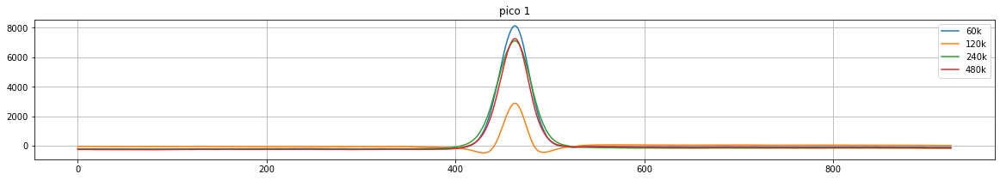

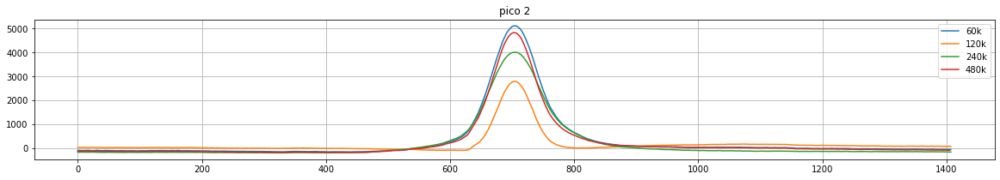

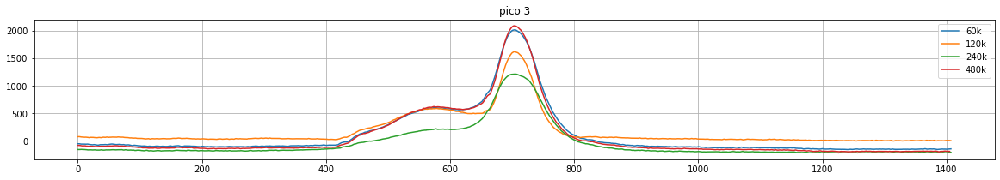

In [154]:
for i,x in enumerate(picos_60k):
    plt.figure(figsize=(20,3))
    plt.plot(x,'-')
    plt.plot(picos_120k[i],'-')
    plt.plot(picos_240k[i],'-')
    plt.plot(picos_480k[i],'-')
    plt.legend(['60k','120k','240k','480k'])
    plt.title('pico ' +str(i+1))
    plt.grid(True)

In [194]:
xpicos_60k,indexs=get_peaks(f2.df.x1 - f2.df.x1.min(),thr)
ypicos_60k=-f2.df.y1 + f2.df.y1.max()

picos:  3


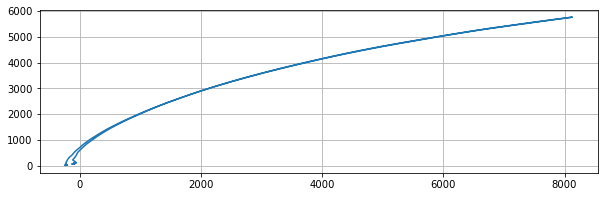

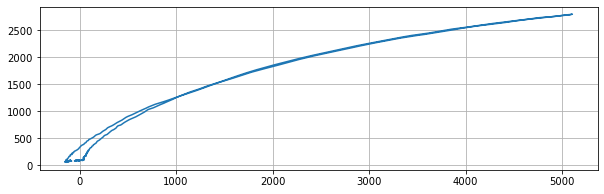

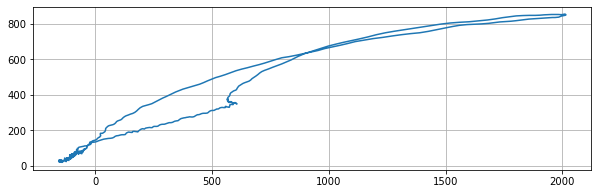

In [197]:
for j,pico in enumerate(xpicos_60k):
    plt.figure(figsize=(10,3))
    plt.plot(pico,ypicos_60k[list(indexs[j])])
    plt.grid(True)
    
    

In [171]:
px.line(-f2.df.y1 + f2.df.y1.max())

In [124]:
for ncol in f2.df.columns:
    col=f2.df[ncol]
    peaks=get_peaks(col,thr=0.)
    

In [121]:
f3=Exp('.//2022//2022.EI3')

In [122]:
f3.plot(2)